<a href="https://colab.research.google.com/github/quaziharis/machine_Learning/blob/master/HakathonCreditcarddefault.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import sklearn as sk
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import pandas_profiling 

In [0]:
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

In [0]:
train = pd.read_csv('/content/train_20D8GL3.csv')
xtest_given = pd.read_csv('/content/test_O6kKpvt.csv')

In [0]:
train.head(30)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
0,25150,360000,2,2,2,25,-1,-1,-1,-1,-1,-1,20952,12590,3479,3435,8870,2020,12590,3479,3446,8870,2020,27043,0
1,13470,240000,2,1,2,46,2,2,-2,-1,0,-1,456,0,0,2240,1681,2267,0,0,2240,0,2267,3074,0
2,3092,320000,2,2,1,41,0,0,0,0,0,0,49846,53811,38717,35409,35036,35939,5000,2000,2000,3000,3000,1500,0
3,13973,50000,2,2,2,24,-1,-1,-2,-2,-2,-2,2675,0,0,0,0,0,0,0,0,0,0,0,1
4,10567,80000,1,3,1,52,-1,0,0,0,0,0,35861,18521,19385,20561,21261,21457,1500,1500,1500,1028,876,1449,0
5,28050,150000,2,1,2,29,-2,-2,-2,-2,-2,-1,0,5067,131,987,0,14001,5067,131,987,400,14001,0,1
6,23327,260000,2,1,1,36,0,0,0,0,0,-1,122825,88273,91908,90857,-81334,142645,5000,6000,5020,81569,331788,10002,0
7,10728,50000,2,2,1,31,0,0,0,0,0,0,13641,15409,16052,15993,15780,15549,2000,1223,1000,1000,1000,1000,0
8,17227,130000,2,2,2,24,0,0,0,0,0,0,121720,115630,115939,109428,90359,89216,4155,5802,3487,2908,3013,3093,0
9,22039,60000,2,3,2,28,-1,-1,0,0,0,0,396,43902,44802,42984,38495,39038,87804,2000,1567,1320,1500,2000,0


In [0]:
train.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
count,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.00000,21000.000000,21000.000000,21000.00000,21000.000000,21000.000000,21000.000000,21000.000000,2.100000e+04,21000.000000,21000.000000,21000.000000,21000.000000,2.100000e+04,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000
mean,14949.183667,167214.746667,1.607571,1.854190,1.551714,35.461619,-0.01119,-0.127238,-0.164857,-0.21819,-0.260952,-0.288667,51501.542381,49463.502667,4.723258e+04,43387.372476,40398.551095,38931.194000,5686.349333,5.923003e+03,5202.325333,4793.172000,4797.012952,5211.736762,0.221190
std,8632.775153,128965.188482,0.488303,0.791628,0.521176,9.206628,1.12321,1.198957,1.198624,1.17221,1.141454,1.151592,73453.641859,70866.586004,6.953988e+04,64081.073110,60396.811177,59196.499234,16868.075695,2.390953e+04,17006.416467,15467.403159,15270.031988,17698.795697,0.415058
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.00000,-2.000000,-2.000000,-2.00000,-2.000000,-2.000000,-14386.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7508.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.00000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,3564.750000,3000.000000,2.686250e+03,2332.000000,1759.000000,1242.750000,998.250000,8.360000e+02,390.000000,284.000000,241.000000,102.000000,0.000000
50%,14939.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,22578.000000,21550.000000,2.024200e+04,19158.500000,18266.500000,17203.500000,2100.000000,2.011000e+03,1811.500000,1500.000000,1500.000000,1500.000000,0.000000
75%,22386.750000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,67876.250000,64918.250000,6.082675e+04,55376.750000,50517.250000,49463.000000,5023.250000,5.000000e+03,4500.000000,4002.250000,4051.000000,4000.000000,0.000000
max,29998.000000,800000.000000,2.000000,6.000000,3.000000,75.000000,8.00000,8.000000,8.000000,8.00000,8.000000,8.000000,746814.000000,743970.000000,1.664089e+06,706864.000000,587067.000000,699944.000000,873552.000000,1.684259e+06,889043.000000,621000.000000,417990.000000,528666.000000,1.000000


In [0]:
pandas_profiling.ProfileReport(train)

/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,25
Number of observations,21000
Total Missing (%),0.0%
Total size in memory,4.0 MiB
Average record size in memory,200.0 B
Numeric,18
Categorical,0
Boolean,2
Date,0
Text (Unique),0
Rejected,5


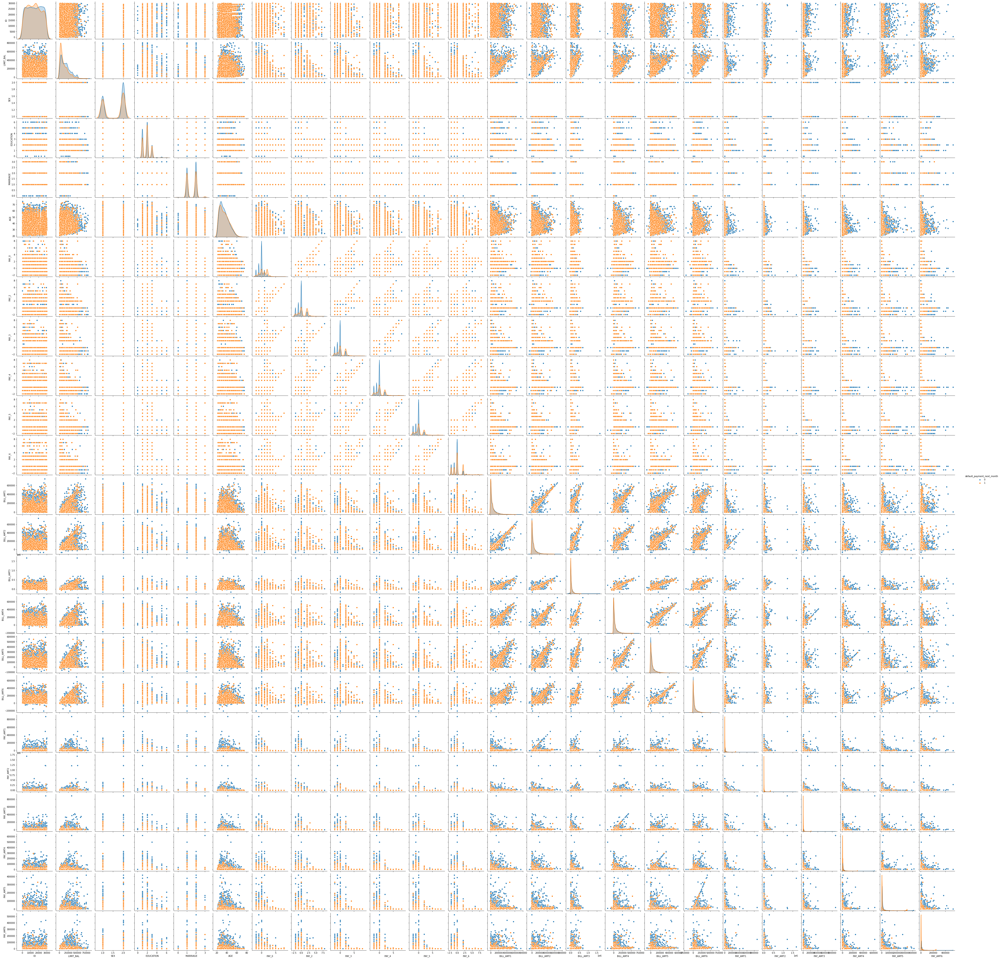

In [0]:
sn.pairplot(train,hue = 'default_payment_next_month')

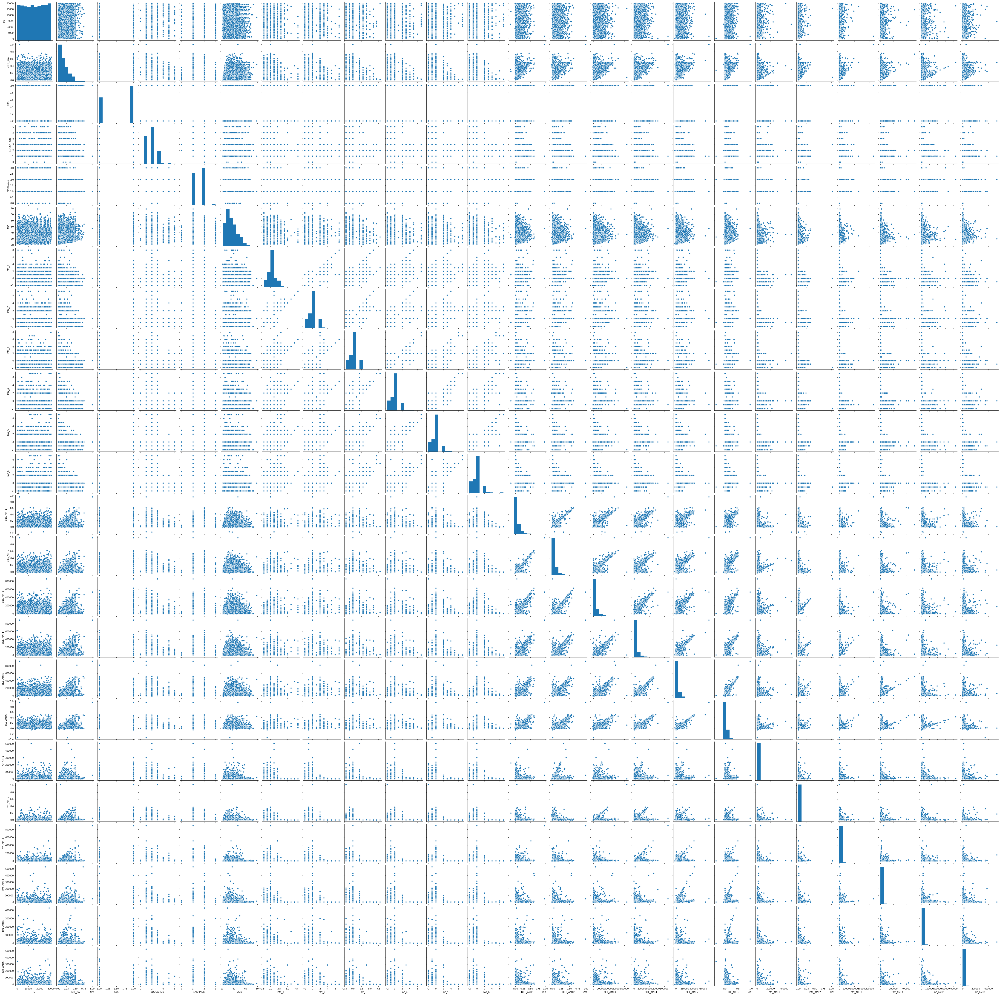

In [0]:
sn.pairplot(xtest_given)

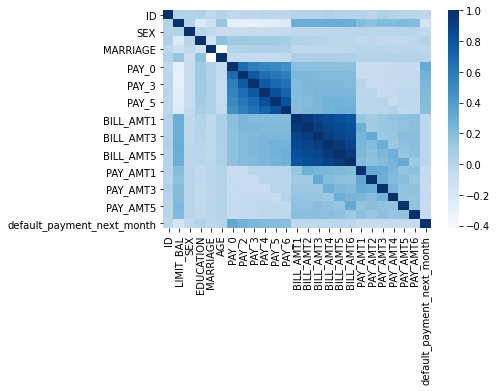

In [0]:
corelation = train.corr()
sn.heatmap(corelation, cmap = "Blues")

In [0]:
x = train[['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']]
y = train[['default_payment_next_month']]

In [0]:
def decision_tree():
  global dec_clf
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  
  from sklearn import tree
  dec_clf = tree.DecisionTreeClassifier(max_depth=15).fit(xtrain, ytrain)
  print("\n**Decision Tree**\n")
  
  print('train accuracy',dec_clf.score(xtrain,ytrain))
  print('test accuracy',dec_clf.score(xtest,ytest))
 
  y_pred = dec_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(dec_clf,x,y,cv=10)
  print('\nCross validation of Decision Tree:  ',cv.mean())
  
  return;


def random_forest():
  global random_clf, xtrain, xtest, ytrain, ytest
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  from sklearn.ensemble import RandomForestClassifier
  random_clf = RandomForestClassifier(max_depth=15, random_state=1,n_estimators=200)
  random_clf.fit(xtrain,ytrain)
  print("\n**Random forest**\n")
  
  print('train accuracy',random_clf.score(xtrain,ytrain))
  print('test accuracy',random_clf.score(xtest,ytest))
  
  y_pred = random_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  
  
  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(random_clf,x,y,cv=10)
  print('\nCross validation of random forest:  ',cv.mean())
  
  return;

def adaboost():
  global adaboost_clf, xtrain, xtest, ytrain, ytest

  from sklearn.model_selection import train_test_split  
  xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,shuffle=True)

  from sklearn.tree import DecisionTreeClassifier
  from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

  adaboost_clf = AdaBoostClassifier(RandomForestClassifier(max_depth=15),n_estimators=100, learning_rate=1.0,)
  adaboost_clf.fit(xtrain,ytrain)

  print("\n\n **AdaBoost Classifier**\n")
  print('training:',adaboost_clf.score(xtrain,ytrain))
  print('test:',adaboost_clf.score(xtest,ytest)) 
     
  y_pred = adaboost_clf.predict(xtest)

  from sklearn.metrics import precision_recall_fscore_support
  print('precision_recall_fscore_support\n',precision_recall_fscore_support(ytest, y_pred, average=None),'\n')

  from sklearn.metrics import classification_report
  print('classification_report\n',classification_report(ytest,y_pred),'\n')

  from sklearn.metrics import confusion_matrix
  print('confusion_matrix\n',confusion_matrix(ytest,y_pred))

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(adaboost_clf,x,y,cv=10)
  print('\nCross validation of adaboost:  ',cv.mean())
  
  return;

In [0]:
random_forest()


**Random forest**

train accuracy 0.9162585034013605
test accuracy 0.8207936507936507
classification report :  
                precision    recall  f1-score   support

           0       0.84      0.95      0.89      4897
           1       0.69      0.36      0.47      1403

    accuracy                           0.82      6300
   macro avg       0.76      0.65      0.68      6300
weighted avg       0.80      0.82      0.80      6300

confusion matrix:
 [[4672  225]
 [ 904  499]]

Cross validation of random forest:   0.8195714285714285


In [0]:
ypred_simple_rf = random_clf.predict(xtest_given)

In [0]:
pd.DataFrame(ypred_simple_rf).to_csv("simple_randomf.csv")

In [0]:
decision_tree()
random_forest()
adaboost()


**Decision Tree**

train accuracy 1.0
test accuracy 0.7247619047619047
classification report :  
                precision    recall  f1-score   support

           0       0.83      0.81      0.82      4912
           1       0.38      0.41      0.40      1388

    accuracy                           0.72      6300
   macro avg       0.61      0.61      0.61      6300
weighted avg       0.73      0.72      0.73      6300

confusion matrix:
 [[3996  916]
 [ 818  570]]

Cross validation of Decision Tree:   0.7276190476190476

**Random forest**

train accuracy 0.9131292517006803
test accuracy 0.8196825396825397
classification report :  
                precision    recall  f1-score   support

           0       0.84      0.95      0.89      4947
           1       0.65      0.35      0.45      1353

    accuracy                           0.82      6300
   macro avg       0.75      0.65      0.67      6300
weighted avg       0.80      0.82      0.80      6300

confusion matrix:
 [[4697  2

In [0]:
decision_tree()
random_forest()
adaboost()


**Decision Tree**

train accuracy 0.9019958946586889
test accuracy 0.802303067359625
classification report :  
                precision    recall  f1-score   support

           0       0.85      0.74      0.79      4946
           1       0.77      0.87      0.81      4867

    accuracy                           0.80      9813
   macro avg       0.81      0.80      0.80      9813
weighted avg       0.81      0.80      0.80      9813

confusion matrix:
 [[3655 1291]
 [ 649 4218]]

Cross validation of Decision Tree:   0.8166921430755121

**Random forest**

train accuracy 0.9523518364851291
test accuracy 0.8759808417405482
classification report :  
                precision    recall  f1-score   support

           0       0.90      0.85      0.87      4895
           1       0.86      0.90      0.88      4918

    accuracy                           0.88      9813
   macro avg       0.88      0.88      0.88      9813
weighted avg       0.88      0.88      0.88      9813

confusion matr

KeyboardInterrupt: ignored

In [0]:
ypred_pt_rf = random_clf.predict(xtest_g_selected)

In [0]:
pd.DataFrame(ypred_pt_rf).to_csv("para_tune_RF.csv")

In [0]:
data = pd.read_csv('/content/para_tune_RF.csv')

In [0]:
data.head()

,Unnamed: 0,0
0,0,1
1,1,0
2,2,0
3,3,0
4,4,0


Text(0.5, 1.0, 'Churn\n(0 :No Churn||1: Churn)')

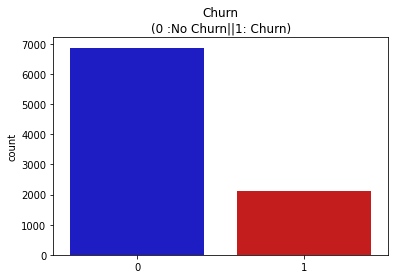

In [0]:
  colors = ["#0101DF","#DF0101"]
  sn.countplot(ypred_pt_rf,data = data, palette=colors)
  plt.title("Churn\n(0 :No Churn||1: Churn)")

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


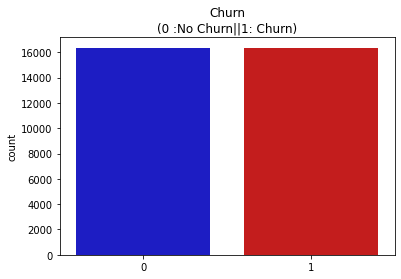

In [0]:
def over_sampling():
  global x,y
  from imblearn.over_sampling import RandomOverSampler
  over_sample = RandomOverSampler(sampling_strategy='minority')
  x, y = over_sample.fit_resample(x, y)

  colors = ["#0101DF","#DF0101"]
  sn.countplot(y,data = train,palette=colors)
  plt.title("Churn\n(0 :No Churn||1: Churn)")
  return;
over_sampling()

In [0]:
decision_tree()
random_forest()
adaboost()


**Decision Tree**

train accuracy 1.0
test accuracy 0.8702741261591767
classification report :  
                precision    recall  f1-score   support

           0       0.94      0.78      0.86      4878
           1       0.82      0.95      0.88      4935

    accuracy                           0.87      9813
   macro avg       0.88      0.87      0.87      9813
weighted avg       0.88      0.87      0.87      9813

confusion matrix:
 [[3829 1049]
 [ 224 4711]]

Cross validation of Decision Tree:   0.896942830938551

**Random forest**

train accuracy 0.9328733021793248
test accuracy 0.8555997146642209
classification report :  
                precision    recall  f1-score   support

           0       0.86      0.85      0.86      4993
           1       0.85      0.86      0.85      4820

    accuracy                           0.86      9813
   macro avg       0.86      0.86      0.86      9813
weighted avg       0.86      0.86      0.86      9813

confusion matrix:
 [[4260  73

In [0]:
  global dec_clf
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  
  from sklearn import tree
  dec_clf = tree.DecisionTreeClassifier().fit(xtrain, ytrain)
  print("\n**Decision Tree**\n")
  
  print('train accuracy',dec_clf.score(xtrain,ytrain))
  print('test accuracy',dec_clf.score(xtest,ytest))
 
  y_pred = dec_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(dec_clf,x,y,cv=10)
  print('\nCross validation of Decision Tree:  ',cv.mean())
  



**Decision Tree**

train accuracy 1.0
test accuracy 0.8639559767655152
classification report :  
                precision    recall  f1-score   support

           0       0.94      0.78      0.85      4882
           1       0.81      0.95      0.88      4931

    accuracy                           0.86      9813
   macro avg       0.88      0.86      0.86      9813
weighted avg       0.88      0.86      0.86      9813

confusion matrix:
 [[3788 1094]
 [ 241 4690]]

Cross validation of Decision Tree:   0.8967899724854783


In [0]:
import pickle
filename = 'decision_tree.sav'
pickle.dump(dec_clf,open(filename,'wb'))

In [0]:
loaded_model = pickle.load(open(filename,'rb'))
result = loaded_model.predict(xtest_given)

In [0]:
print(result)

[0 0 0 ... 0 1 0]


In [0]:
ypred_dt = dec_clf.predict(xtest_given)
ypred_RF = random_clf.predict(xtest_given)
ypred_adaboost = adaboost_clf.predict(xtest_given)

In [0]:
print(ypred_dt)

[0 0 0 ... 0 1 0]


In [0]:
print(ypred_RF)

[0 0 0 ... 0 0 1]


In [0]:
print(ypred_adaboost)

[0 0 0 ... 0 0 0]


In [0]:
pd.DataFrame(ypred_adaboost).to_csv("adaboost_prediction.csv")

In [0]:
adaboost_prediction = pd.read_csv('/content/adaboost_prediction.csv')

In [0]:
adaboost_prediction.columns = ['ID','default_payment_next_month']

In [0]:
adaboost_prediction.head()

,ID,default_payment_next_month
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [0]:
pd.DataFrame(ypred_adaboost).to_csv("adaboost_prediction_head.csv")

In [0]:
pd.DataFrame(a).to_csv("ID_adaboost_test.csv")

In [0]:
print(ypred_RF)

[0 0 0 ... 0 0 1]


In [0]:
pd.DataFrame(ypred_RF).to_csv("randomforest_prediction.csv")

In [0]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, VotingClassifier,AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,shuffle=True)

adaboost_clf = AdaBoostClassifier(RandomForestClassifier())
DC_clf = DecisionTreeClassifier()
RF_clf = RandomForestClassifier(n_estimators=50, random_state=1)

VC_clf = VotingClassifier(estimators = [('logistic',log_clf),('DC',DC_clf),('Rf',RF_clf)], voting='hard').fit(xtrain,ytrain)
print('Accuracy of training set: ',VC_clf.score(xtrain, ytrain))
print('Accuracy of test set: ',VC_clf.score(xtest, ytest))
y_pred = VC_clf.predict(xtest)
from sklearn.metrics import precision_recall_fscore_support
print('precision_recall_fscore_support\n',precision_recall_fscore_support(ytest, y_pred, average=None),'\n')
from sklearn.metrics import classification_report
print('classification_report\n',classification_report(ytest,y_pred),'\n')
from sklearn.metrics import confusion_matrix
print('confusion_matrix\n',confusion_matrix(ytest,y_pred))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy of training set:  0.9999563261562651
Accuracy of test set:  0.8954448180984409
precision_recall_fscore_support
 (array([0.95918849, 0.84696807]), array([0.82659077, 0.96465059]), array([0.8879668 , 0.90198701]), array([4919, 4894])) 

classification_report
               precision    recall  f1-score   support

           0       0.96      0.83      0.89      4919
           1       0.85      0.96      0.90      4894

    accuracy                           0.90      9813
   macro avg       0.90      0.90      0.89      9813
weighted avg       0.90      0.90      0.89      9813
 

confusion_matrix
 [[4066  853]
 [ 173 4721]]


In [0]:
ypred_VC = VC_clf.predict(xtest_given)

In [0]:
pd.DataFrame(ypred_VC).to_csv("voting_clf.csv")

In [0]:
ypred_VC1 = VC_clf.predict(xtest_given)
pd.DataFrame(ypred_VC).to_csv("voting_clf_ada.csv")

In [0]:
x = train[['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']]
y = train[['default_payment_next_month']]

from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
clf = RandomForestClassifier(n_estimators=50, random_state=1).fit(xtrain,ytrain)


#Feature selection using RFE
from sklearn.feature_selection import RFE
selector = RFE(clf, 10, step=1)
selector = selector.fit(x,y)
l1 = selector.ranking_
l2 = x.columns
for i in zip(l1,l2):
  print(i)


(1, 'ID')
(1, 'LIMIT_BAL')
(15, 'SEX')
(11, 'EDUCATION')
(14, 'MARRIAGE')
(1, 'AGE')
(1, 'PAY_0')
(3, 'PAY_2')
(9, 'PAY_3')
(10, 'PAY_4')
(12, 'PAY_5')
(13, 'PAY_6')
(1, 'BILL_AMT1')
(1, 'BILL_AMT2')
(1, 'BILL_AMT3')
(2, 'BILL_AMT4')
(1, 'BILL_AMT5')
(1, 'BILL_AMT6')
(4, 'PAY_AMT1')
(1, 'PAY_AMT2')
(5, 'PAY_AMT3')
(8, 'PAY_AMT4')
(7, 'PAY_AMT5')
(6, 'PAY_AMT6')


In [0]:
x = train[['ID','LIMIT_BAL','LIMIT_BAL','PAY_0','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']]
y = train[['default_payment_next_month']]

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


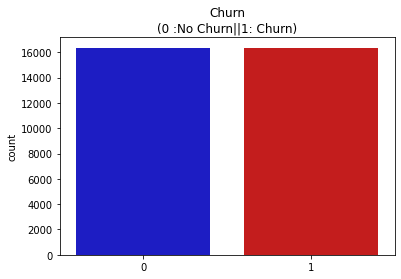

In [0]:
def over_sampling():
  global x,y
  from imblearn.over_sampling import RandomOverSampler
  over_sample = RandomOverSampler(sampling_strategy='minority')
  x, y = over_sample.fit_resample(x, y)

  colors = ["#0101DF","#DF0101"]
  sn.countplot(y,data = train,palette=colors)
  plt.title("Churn\n(0 :No Churn||1: Churn)")
  return;
over_sampling()

In [0]:
decision_tree()
random_forest()
adaboost()


**Decision Tree**

train accuracy 1.0
test accuracy 0.8619178640578824
classification report :  
                precision    recall  f1-score   support

           0       0.93      0.78      0.85      4959
           1       0.81      0.94      0.87      4854

    accuracy                           0.86      9813
   macro avg       0.87      0.86      0.86      9813
weighted avg       0.87      0.86      0.86      9813

confusion matrix:
 [[3878 1081]
 [ 274 4580]]

Cross validation of Decision Tree:   0.9003668602873738

**Random forest**

train accuracy 0.9575053500458576
test accuracy 0.8764903699174564
classification report :  
                precision    recall  f1-score   support

           0       0.90      0.85      0.87      4958
           1       0.86      0.90      0.88      4855

    accuracy                           0.88      9813
   macro avg       0.88      0.88      0.88      9813
weighted avg       0.88      0.88      0.88      9813

confusion matrix:
 [[4215  7

In [0]:
ypred_ada_FE = adaboost_clf.predict(xtest_g_selected)
pd.DataFrame(ypred_ada_FE).to_csv("after_FE_adaboost.csv")

In [0]:
xtest_g_selected = xtest_given[['ID','LIMIT_BAL','LIMIT_BAL','PAY_0','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']]

In [0]:
ypred_rf_fe = random_clf.predict(xtest_g_selected)

In [0]:
pd.DataFrame(ypred_rf_fe).to_csv("after_FE_random.csv")

In [0]:
def random_forest():
  global random_clf, xtrain, xtest, ytrain, ytest
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  from sklearn.ensemble import RandomForestClassifier
  random_clf = RandomForestClassifier(max_depth=30, random_state=1,n_estimators=200)
  random_clf.fit(xtrain,ytrain)
  print("\n**Random forest**\n")
  
  print('train accuracy',random_clf.score(xtrain,ytrain))
  print('test accuracy',random_clf.score(xtest,ytest))
  
  y_pred = random_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  
  
  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(random_clf,x,y,cv=10)
  print('\nCross validation of random forest:  ',cv.mean())
  
  return;

In [0]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
from sklearn.ensemble import GradientBoostingClassifier

GB_clf = GradientBoostingClassifier().fit(xtrain,ytrain)

print('train accuracy',GB_clf.score(xtrain,ytrain))
print('test accuracy',GB_clf.score(xtest,ytest))
  
y_pred = GB_clf.predict(xtest)
  
from sklearn.metrics import classification_report, confusion_matrix
print("classification report :  \n ", classification_report(ytest, y_pred))

print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
confusion_matrix = confusion_matrix(ytest, y_pred)  
  
from sklearn.model_selection import cross_val_score
cv = cross_val_score(random_clf,x,y,cv=10)
print('\nCross validation of random forest:  ',cv.mean())

train accuracy 0.7234572214700615
test accuracy 0.7096708447977174
classification report :  
                precision    recall  f1-score   support

           0       0.68      0.79      0.73      4884
           1       0.75      0.63      0.68      4929

    accuracy                           0.71      9813
   macro avg       0.72      0.71      0.71      9813
weighted avg       0.72      0.71      0.71      9813

confusion matrix:
 [[3882 1002]
 [1847 3082]]


KeyboardInterrupt: ignored

In [0]:
  from sklearn.model_selection import train_test_split  
  xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,shuffle=True)

  from sklearn.tree import DecisionTreeClassifier
  from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

  adaboost_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=15),n_estimators=100, learning_rate=0.5)
  adaboost_clf.fit(xtrain,ytrain)

  print("\n\n **AdaBoost Classifier**\n")
  print('training:',adaboost_clf.score(xtrain,ytrain))
  print('test:',adaboost_clf.score(xtest,ytest)) 
     
  y_pred = adaboost_clf.predict(xtest)

  from sklearn.metrics import precision_recall_fscore_support
  print('precision_recall_fscore_support\n',precision_recall_fscore_support(ytest, y_pred, average=None),'\n')

  from sklearn.metrics import classification_report
  print('classification_report\n',classification_report(ytest,y_pred),'\n')

  from sklearn.metrics import confusion_matrix
  print('confusion_matrix\n',confusion_matrix(ytest,y_pred))

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(adaboost_clf,x,y,cv=10)
  print('\nCross validation of adaboost:  ',cv.mean())



 **AdaBoost Classifier**

training: 1.0
test: 0.9300927341281973
precision_recall_fscore_support
 (array([0.94017274, 0.92064745]), array([0.91736896, 0.94260307]), array([0.92863088, 0.93149591]), array([4865, 4948])) 

classification_report
               precision    recall  f1-score   support

           0       0.94      0.92      0.93      4865
           1       0.92      0.94      0.93      4948

    accuracy                           0.93      9813
   macro avg       0.93      0.93      0.93      9813
weighted avg       0.93      0.93      0.93      9813
 

confusion_matrix
 [[4463  402]
 [ 284 4664]]

Cross validation of adaboost:   0.9632222561907675


In [0]:
ypred_ada_PT = adaboost_clf.predict(xtest_g_selected)
pd.DataFrame(ypred_ada_PT).to_csv("after_PT_adaboost.csv")

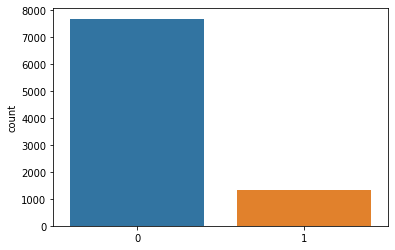

In [0]:
 sn.countplot(ypred_ada_PT)